<h1><b>TIME SERIE FORECASTING FOR ENERGY CONSUMPTION USING SARIMA MODEL 

<b>Data:</b> hourly time series data of energy consumption in PJM Interconnection LLC (PJM), a regional transmission organization (RTO) in the United States. The hourly power consumption data comes from PJM's website and are in megawatts (MW). This particular dataset was gathered from Kaggle.

<b>Goal:</b> be able to predict the next 24h of energy consumption, hourly.

<b>Method:</b> SARIMA type of models

<h1><B>Descriptive analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Inhabilitar FutureWarnings temporaly
warnings.simplefilter(action='ignore', category=FutureWarning)

#we read the dataset'
df = pd.read_csv('PJME_hourly.csv')
print(df.shape)
df.tail()

(145366, 2)


,Datetime,PJME_MW
145361,2018-01-01 20:00:00,44284.0
145362,2018-01-01 21:00:00,43751.0
145363,2018-01-01 22:00:00,42402.0
145364,2018-01-01 23:00:00,40164.0
145365,2018-01-02 00:00:00,38608.0


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  145366 non-null  object 
 1   PJME_MW   145366 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.2+ MB


In [3]:
df['Datetime'] = pd.to_datetime(df['Datetime']) #change from string to datetime
df = df.sort_values('Datetime') #sort values
df.reset_index(inplace=True, drop =True)
df['PJME_MW'] = df['PJME_MW'].astype(int) #change the values from float to integer
df.head()

,Datetime,PJME_MW
0,2002-01-01 01:00:00,30393
1,2002-01-01 02:00:00,29265
2,2002-01-01 03:00:00,28357
3,2002-01-01 04:00:00,27899
4,2002-01-01 05:00:00,28057


We will now do a descriptive analysis of our serie. Lets start by plottin the serie.

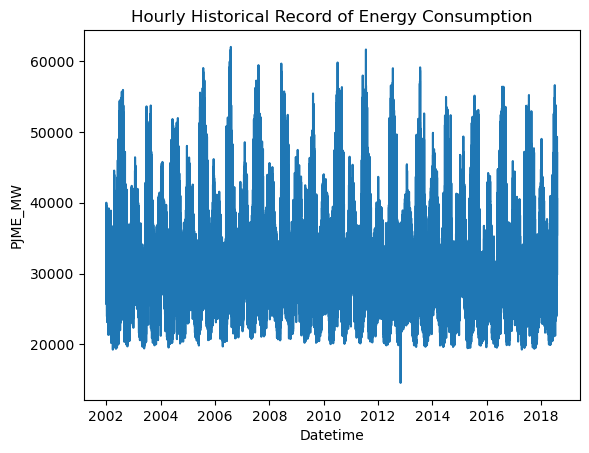

In [4]:
plt.figure(figsize=(12,6))
sns.lineplot(x='Datetime', y='PJME_MW', data=df)
plt.title('Hourly Historical Record of Energy Consumption')
plt.show()

In [5]:
import plotly.express as px

# Plot the distribution of the energy consumption
fig = px.histogram(df, x='PJME_MW', nbins=50, title='Distribution of Hourly Energy Consumption')
fig.show()

In [6]:
# Hourly consumption patterns:
df['Hour'] = df['Datetime'].apply(lambda x : x.hour)
fig = px.box(df, x='Hour', y='PJME_MW', title='Hourly Consumption Patterns')
fig.show()

In [7]:
# Hourly consumption patterns:
df['Month'] = df['Datetime'].apply(lambda x : x.month)
fig = px.box(df, x='Month', y='PJME_MW', title='Monthly Consumption Patterns')
fig.show()

In [8]:
#to get an idea of how daily and hourly consumption correlates we will plot a heatmap:
df['Dayweek'] = df['Datetime'].apply(lambda x : x.dayofweek)
df_map = df.groupby(['Dayweek', 'Hour']).mean()['PJME_MW'].reset_index()
df_map = df_map.pivot('Dayweek', 'Hour','PJME_MW')
fig = px.imshow(df_map, labels=dict(x="Hour", y="Dayweek", color = 'Avg Consumption'),
                 x=list(range(24)), y=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                 title='Average Hourly Consumption Heatmap')
fig.show()

<h1><B>Preparing the dataset

A time series is decomposed as follows:
x_t = T_t + S_t + C_t + R_t

Corresponding to trend, seasonality (collects oscillations within a period), cyclical variation and noise (irregular and not always predictable elements). This scheme is for an additive series, but there are also multiplicative and mixed types.

To predict a time series, we have to make sure that it is stationary. Since then, it fulfills many properties, such as being able to ensure that it can be approximated by an ARMA model (Wold's Decomposition Theorem), and finding a model that explains its autocorrelation is much simpler. A stochastic process being stationary means that its statistical properties do not change over time. We distinguish two types of stationarity: in variance and in mean.

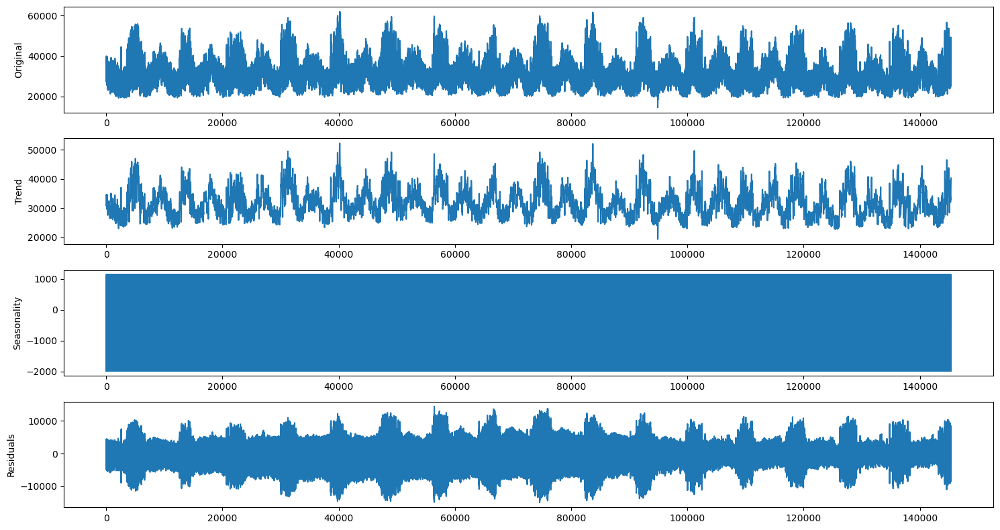

In [9]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Trend and seasonality decomposition:
decomposition = seasonal_decompose(df['PJME_MW'], model='additive', period=24)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1, figsize=(15,8))
df['PJME_MW'].plot(ax=ax1)
ax1.set_ylabel('Original')
trend.plot(ax=ax2)
ax2.set_ylabel('Trend')
seasonal.plot(ax=ax3)
ax3.set_ylabel('Seasonality')
residual.plot(ax=ax4)
ax4.set_ylabel('Residuals')
plt.tight_layout()
plt.show()

<h2>Is the serie Stationary in Mean?

To predict a time series, we have to make sure that it is stationary. A non-stationary series can be identified if its trend is clearly positive/negative. To check that a series is stationary in mean, we will apply the Dickey-Fuller test. This test seeks, through a hypothesis test, whether the series has a unit root or not. If it has a unit root, then the series is non-stationary at the mean. This is because when there is a unit root in an ARMA model, it can be shown that the variance is not constant. If the test gives a p-value less than the significance value, the series is stationary at the mean since we would ensure that it does not have a unit root, and if the p-value is greater, we cannot ensure anything, but it may be stationary at the mean.

In [10]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series):
    result = adfuller(series, autolag='AIC')
    print("Results of Dickey-Fuller test:")
    print("p-value:", result[1])
    print("Stastistical test:", result[0])
    print("Critical Values:", result[4])
    
    if result[1] <= 0.05:
        print("Conclusion: the serie is stationary")
    else:
        print("Conclusion: the serie is not stationary")
        
adf_test(df['PJME_MW'])

Results of Dickey-Fuller test:
p-value: 0.0
Stastistical test: -19.881348413991926
Critical Values: {'1%': -3.4303950093987075, '5%': -2.8615598935174043, '10%': -2.566780588611286}
Conclusion: the serie is stationary


Our serie is stationary in mean (no clear trend). If it was, we should lag the serie until we get a stationary serie. 

<h2>Is the serie Stationary in Variance?

A non-stationary series in variance is visually identified by substantial changes in the dispersion of the series. The closer the data is to a normal distribution, the closer it is to variance stationarity. To transform the data to a more normal distribution, we can apply the Box-Cox transformation. This function resembles the data to a normal distribution, via looking for the lowest standard deviation. This way we get the dispersion to be more constant.

The Box-Cox function looks like what we see in the following image. 

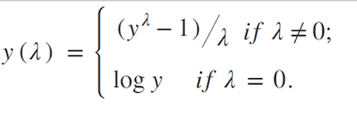

As we can see, it depends on a parameter λ, which part of our job is to find that lambda. If λ=1, there are no changes in the serie. We can let the Python function scipy.stats.boxcox calculate it for us and do the transformation directly, or we can calculate it ourselves using the mean-dispersion range plot: we group the series equally, calculate the mean and standard deviation of each group, and plot the mean on the x-axis and the standard deviation on the y-axis. We do a linear regression of these points, and the 1- λ would be the slope coefficient of this regression. This is so because in this plot we propose to see how the standard deviation (the dispersion) grows with respect to the mean, and that slope would be the one we want to correct by the transformation. We will use the Box-Jenkins method.

<b>Note:</b> the serie must be positive in order to apply Box-Jenkins. If not, there are other techniques.

Lambda value used for Transformation: -0.30099345188003623


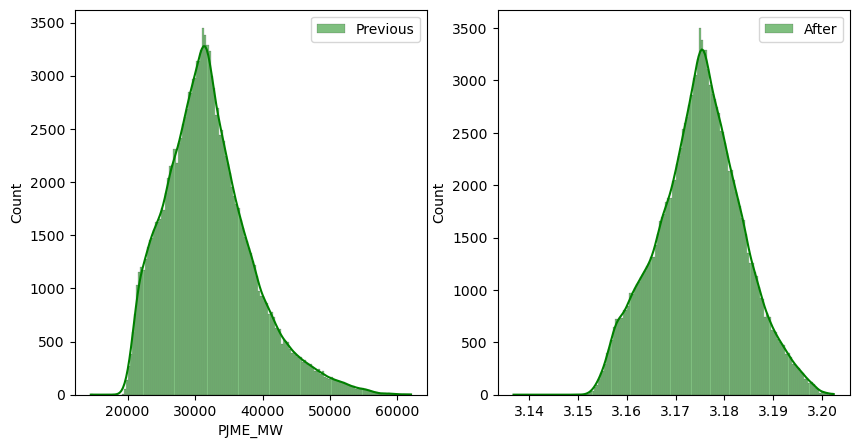

In [11]:
from scipy import stats
from scipy.stats import boxcox

# generate non-normal data (exponential)
original_data = df['PJME_MW']
#original_data = df['Sessions']
  
# transform training data & save lambda value
fitted_data, fitted_lambda = boxcox(original_data)
  
# creating axes to draw plots
fig, ax = plt.subplots(1, 2)
  
# plotting the original data(non-normal) and 
# fitted data (normal)
sns.histplot(original_data,  kde = True, fill= True, 
            label = "Previous", color ="green", ax = ax[0])
  
sns.histplot(fitted_data, kde = True, fill= True, 
            label = "After", color ="green", ax = ax[1])
  
# adding legends to the subplots
# plt.legend(loc = "upper right")
ax[0].legend(loc="upper right")
ax[1].legend(loc="upper right")
  
# rescaling the subplots
fig.set_figheight(5)
fig.set_figwidth(10)
  
print(f"Lambda value used for Transformation: {fitted_lambda}")

As we see, the lambda value is close to 0. Therefore, our serie is not stationary in variance, and we will apply the lambda that the box-cox transformation returned to us in order to make it stationary. 

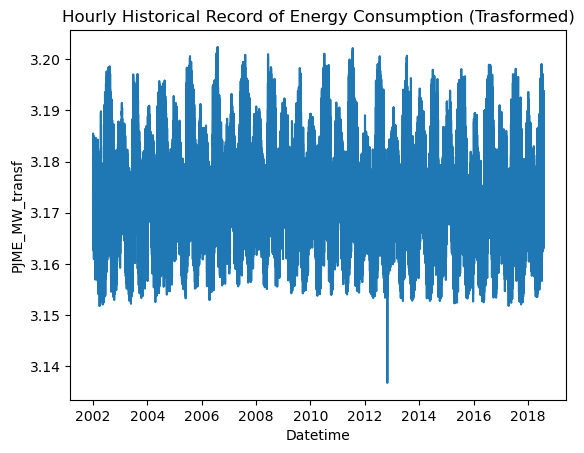

In [12]:
df['PJME_MW_transf'] = fitted_data #we add the transformed data to work with it from now on.
plt.figure(figsize=(10,7))
sns.lineplot(x='Datetime', y='PJME_MW_transf', data=df)
plt.title('Hourly Historical Record of Energy Consumption (Trasformed)')
plt.show()

<b>The serie is stationary!!!

<h2>Data Preprocessing

We can see some outliers around year 2012-2013 that we need to prepocess it

In [13]:
df.loc[df['PJME_MW_transf']<3.151]

,Datetime,PJME_MW,Hour,Month,Dayweek,PJME_MW_transf
94896,2012-10-29 23:00:00,17422,23,10,0,3.146579
94897,2012-10-30 00:00:00,15919,0,10,1,3.141741
94898,2012-10-30 01:00:00,15390,1,10,1,3.139895
94899,2012-10-30 02:00:00,14955,2,10,1,3.138314
94900,2012-10-30 03:00:00,14586,3,10,1,3.136925
94901,2012-10-30 04:00:00,14544,4,10,1,3.136764
94902,2012-10-30 05:00:00,14821,5,10,1,3.137815
94903,2012-10-30 06:00:00,15526,6,10,1,3.140377
94904,2012-10-30 07:00:00,16688,7,10,1,3.144288
94905,2012-10-30 08:00:00,17734,8,10,1,3.147516


In [14]:
'We will replace the outliers by a more reasonable value'
df['PJME_MW_transf'] = df['PJME_MW_transf'].where(df['PJME_MW_transf']>=3.151,3.151)

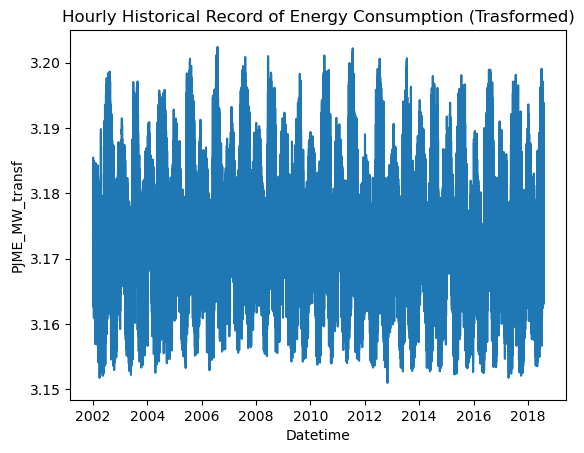

In [15]:
plt.figure(figsize=(10,7))
sns.lineplot(x='Datetime', y='PJME_MW_transf', data=df)
plt.title('Hourly Historical Record of Energy Consumption (Trasformed)')
plt.show()

<h1><B> SARIMA Modelization

The combination of both models would give us an ARMA (p, q) model, which has the following scheme:

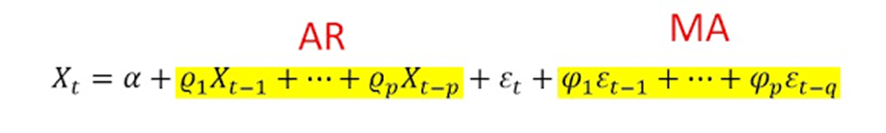

If our model needs to be differenced to be stationary on average, we would have the ARIMA (p, d, q) (AutoRegressive Integrated Moving Average) model, where d stands for the number of times the series needs to be differenced.

In case the model has seasonality of period m, we would have to add the same parameters, but seasonal. We would have the Seasonal ARIMA model, i.e. SARIMA (p, d, q) (P, D, Q, m), where P, D, Q are the seasonal p, d, q. That is, if for example P=2 , it refers to the observation at time t-2m.

If we add an exogenous component to the SARIMA model at each time, we would obtain a SARIMAX model. But in this particular model we may not need it.

<h1>Which is the seasonality of this serie?

We will use Fourier Transforms to get the frequency with highest amplitudes during the whole serie, and will show the seasonality of this dataset.

In [16]:
from scipy import signal as sig
from numpy import fft
# import scipy.fft

def fourier_(df, prominence, col):
    fourier = np.fft.fft(df[col]) #we use the fast-fourier transform algorithm
    power = np.abs(fourier) #amplitud
    freq = fft.fftfreq(len(df[col]))   #frequency

    filtro = freq >= 0 
    freq = freq[filtro]
    power = power[filtro]
    plt.figure( figsize=(11,6) )



    ax1 = plt.subplot( 1, 2, 1 )
    ax1.plot(freq, power, label='residuals')
    ax1.set_title('All Frequencies')
    ax1.set_ylabel( 'Amplitude' )
    ax1.set_xlabel( 'Frequency [1 / Hour]')
    plt.xticks(rotation=90)



    ax2 = plt.subplot( 1, 2, 2 )
    filtro = (freq > 0) & (freq <= 0.25)
    ax2.plot(freq[filtro], power[filtro])
    ax2.set_title('Frequencies in (0, 0.25]')
    ax2.set_ylabel( 'Amplitude' )
    ax2.set_xlabel( 'Frequency [1 / Hour]' )


    #we set a threshold to highlight the significative waves
    peaks = sig.find_peaks(power[(freq >=0) & (freq<=0.25)], prominence=prominence)[0]
    peak_freq = freq[peaks]
    peak_power = power[peaks]
    plt.plot(peak_freq, peak_power, 'ro')


    plt.tight_layout()
    plt.xticks(rotation=90)
    plt.show()

    df_freq = pd.DataFrame()
    df_freq['freq 1/hora']=peak_freq
    df_freq['amplitud']=peak_power
    df_freq['periodo horas'] = 1/df_freq['freq 1/hora']
    df_freq=df_freq.sort_values('amplitud', ascending=False)
    return df_freq

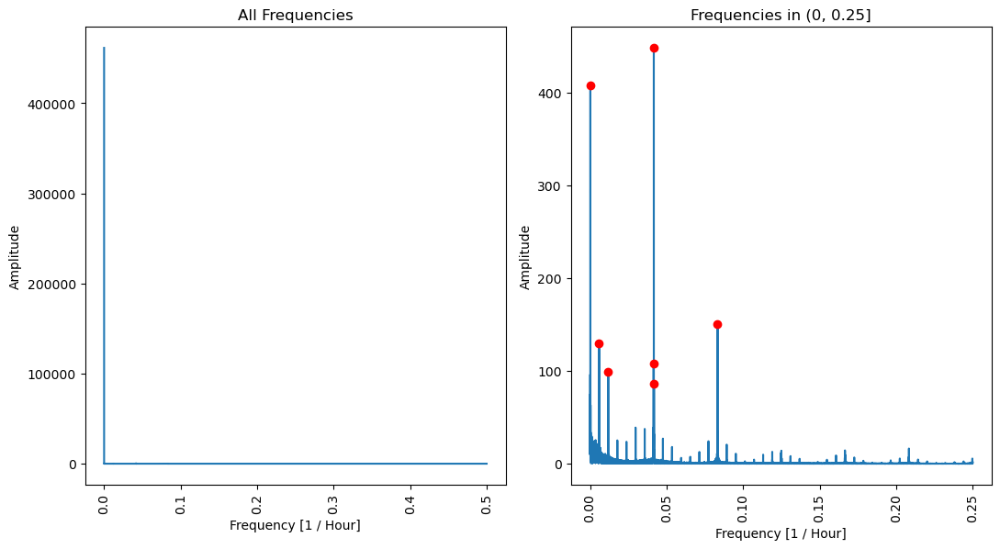

,freq 1/hora,amplitud,periodo horas
4,0.041674,447.958019,23.995708
0,0.000227,407.763177,4405.030303
6,0.083355,149.997375,11.996864
1,0.005950,129.714472,168.053179
3,0.041564,107.443879,24.059252
2,0.011908,98.672037,83.978047
5,0.041791,86.330595,23.928560


In [17]:
fourier_(df, np.e**4.4, 'PJME_MW_transf')

There is a clear daily seasonality, and after a prominent half-year seasonality. Then we have a half-daily and a weekly seasonality. For this model, we will only model with a single seasonality, although there are other techniques for a better approach with multiple seasonalities (working with Fourier series and by mixing different SARIMA models, for example).

<h1>Tune the SARIMA parameters

In [18]:
#first we will train/test split: we will only train with from 2012 onwards
df = df[df['Datetime'].dt.year>=2012]
df.reset_index(inplace=True, drop=True)
limit = round(len(df)*0.8)
df_train = df[:limit]
df_test = df[limit:]

To tune the model, we will use autocorrelation and partial autocorrelation graphs. This shows how the data is correlated with itself on different lags. If in the first bar we get a long bar, thats probably because we need to raise de p or q value. If happens the same for the 24th bar, the P or Q value. Keep in mind that the fist bar is always 1, because is the correlation between an observation with itself.

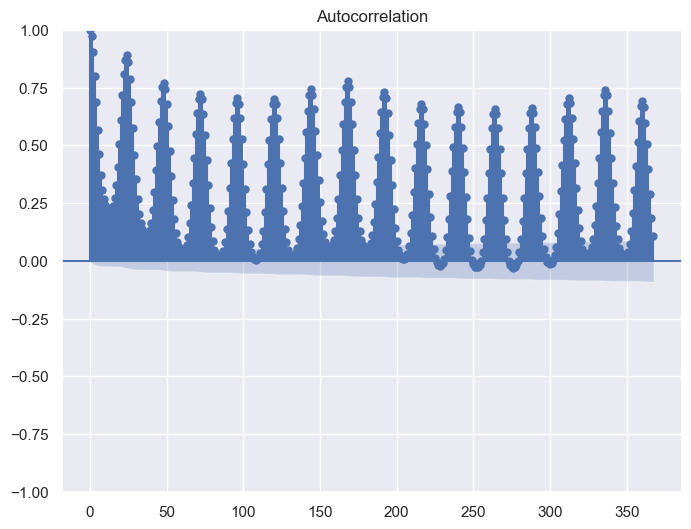

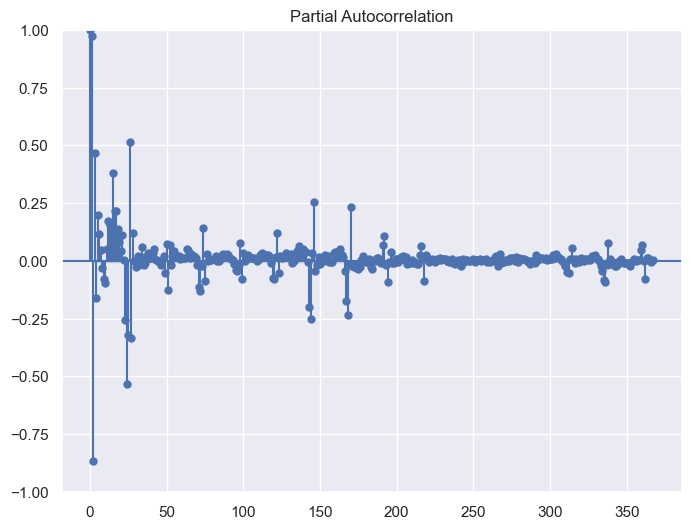

In [19]:
sns.set(rc={'figure.figsize':(8,6)})
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(df['PJME_MW_transf'], lags=367)
plot_pacf(df['PJME_MW_transf'], lags=367)
plt.show()

In [20]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

def sarima(df,p,d,q,p_s,d_s,q_s,s,lags):
    model=SARIMAX(df, order=(p,d,q), seasonal_order=(p_s,d_s,q_s,s))
    model_fit = model.fit()

    print(model_fit.summary())
    model_fit.plot_diagnostics(figsize=(8,8))
    residuals= pd.DataFrame(model_fit.resid)
    plot_acf(residuals[s:],lags=lags)
    plot_pacf(residuals[s:],lags=lags)
    plt.show()
    return model_fit

Now we will start tuning the SARIMA model. First, I will define if D=1 or D=0. If the coefficient of this next model is close to 1 is because D should be 1.

c:\Users\achira03\Anaconda3\envs\base_2\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                                SARIMAX Results                                 
Dep. Variable:           PJME_MW_transf   No. Observations:                46192
Model:             SARIMAX(1, 0, 0, 24)   Log Likelihood              188834.689
Date:                  Thu, 10 Aug 2023   AIC                        -377665.377
Time:                          20:44:56   BIC                        -377647.896
Sample:                               0   HQIC                       -377659.881
                                - 46192                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L24       1.0000   1.86e-06   5.39e+05      0.000       1.000       1.000
sigma2      1.636e-05   8.22e-08    199.019      0.000    1.62e-05    1.65e-05
Ljung-Box (L1) (Q):               44

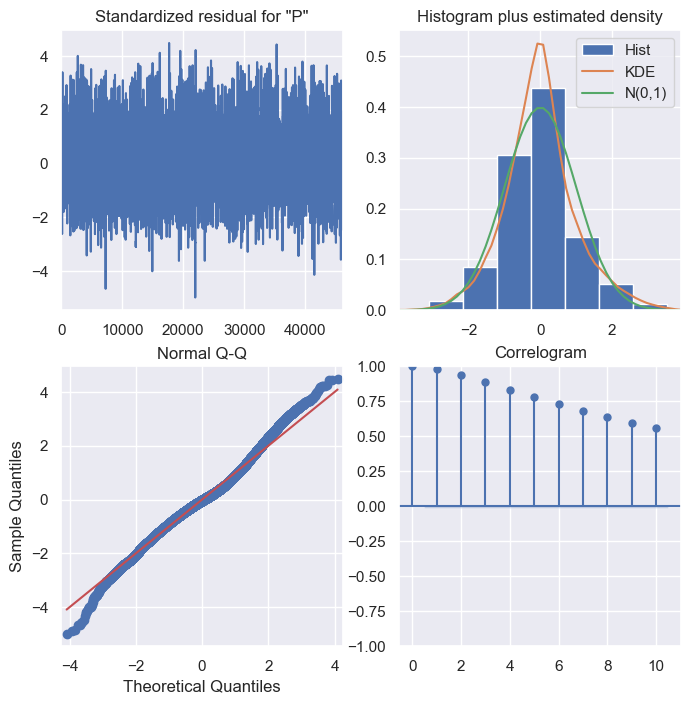

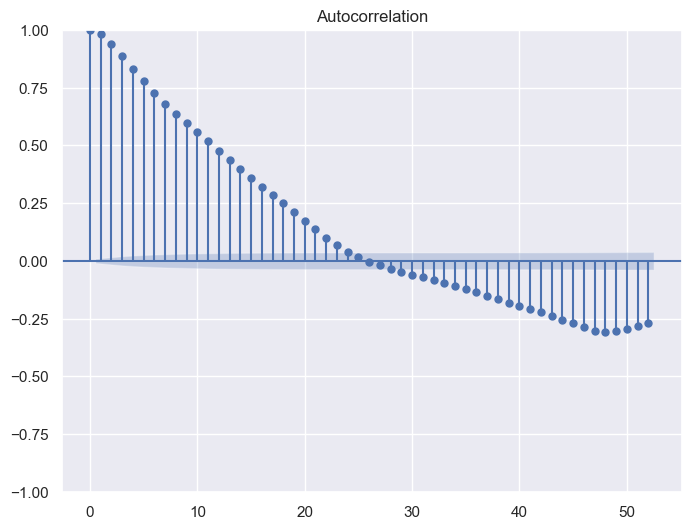

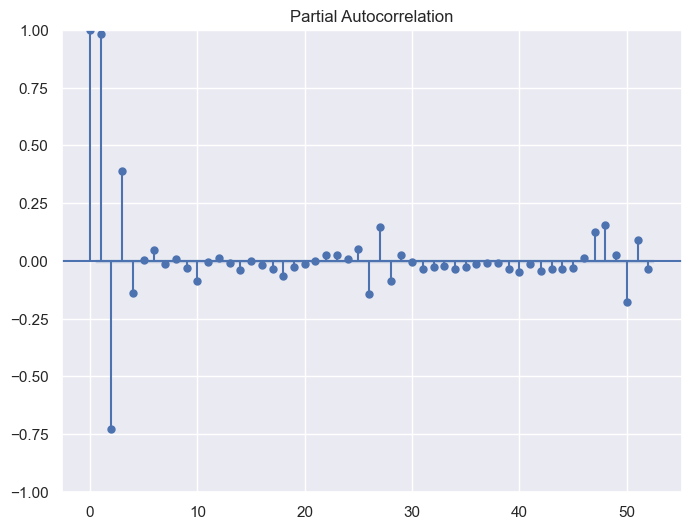

In [21]:
sarima(df_train['PJME_MW_transf'],0,0,0,1,0,0,24,52)

Clearly, D=1. Now, we will start trying different variations until we get a model that its residuals are not too correlated. This means that the bars should be close to 0.

c:\Users\achira03\Anaconda3\envs\base_2\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

c:\Users\achira03\Anaconda3\envs\base_2\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                                      SARIMAX Results                                      
Dep. Variable:                      PJME_MW_transf   No. Observations:                46192
Model:             SARIMAX(1, 0, 1)x(0, 1, [], 24)   Log Likelihood              266248.718
Date:                             Thu, 10 Aug 2023   AIC                        -532491.435
Time:                                     20:46:11   BIC                        -532465.215
Sample:                                          0   HQIC                       -532483.191
                                           - 46192                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9659      0.001   1266.752      0.000       0.964       0.967
ma.L1       8.573e-07      

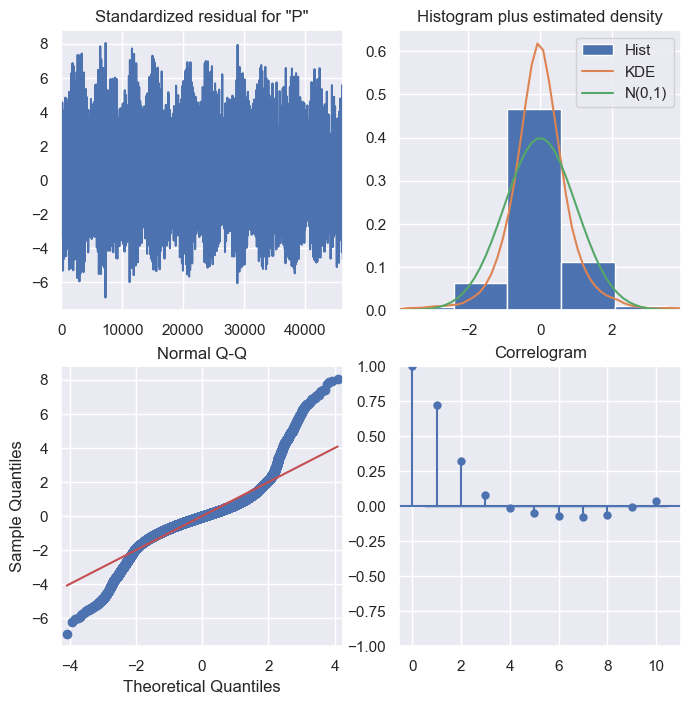

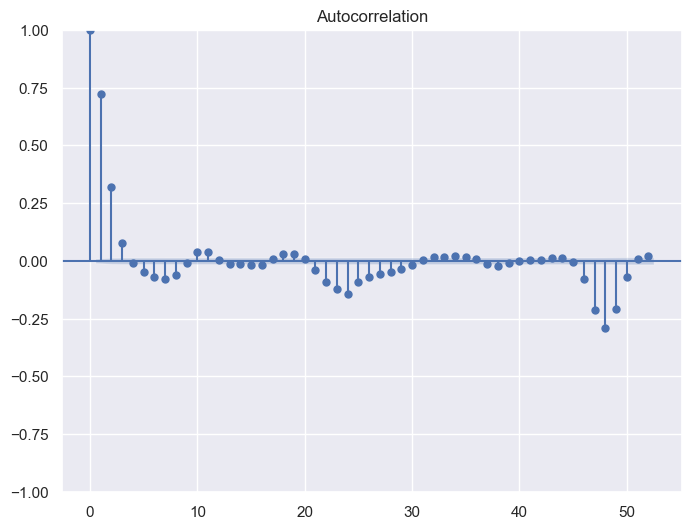

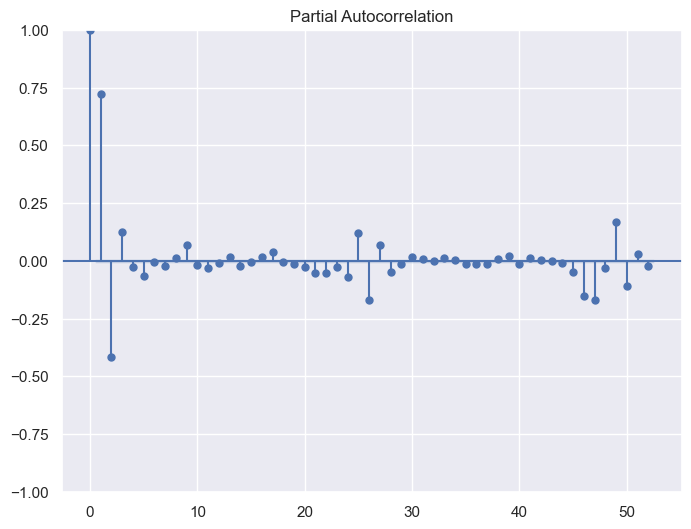

In [22]:
sarima(df_train['PJME_MW_transf'],1,0,1,0,1,0,24,52)

The first bars are still pretty high. Lets try to add another value to the p:

c:\Users\achira03\Anaconda3\envs\base_2\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                                      SARIMAX Results                                      
Dep. Variable:                      PJME_MW_transf   No. Observations:                46192
Model:             SARIMAX(2, 0, 1)x(0, 1, [], 24)   Log Likelihood              287571.551
Date:                             Thu, 10 Aug 2023   AIC                        -575135.102
Time:                                     20:47:41   BIC                        -575100.141
Sample:                                          0   HQIC                       -575124.110
                                           - 46192                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4441      0.003    568.680      0.000       1.439       1.449
ar.L2         -0.4788      

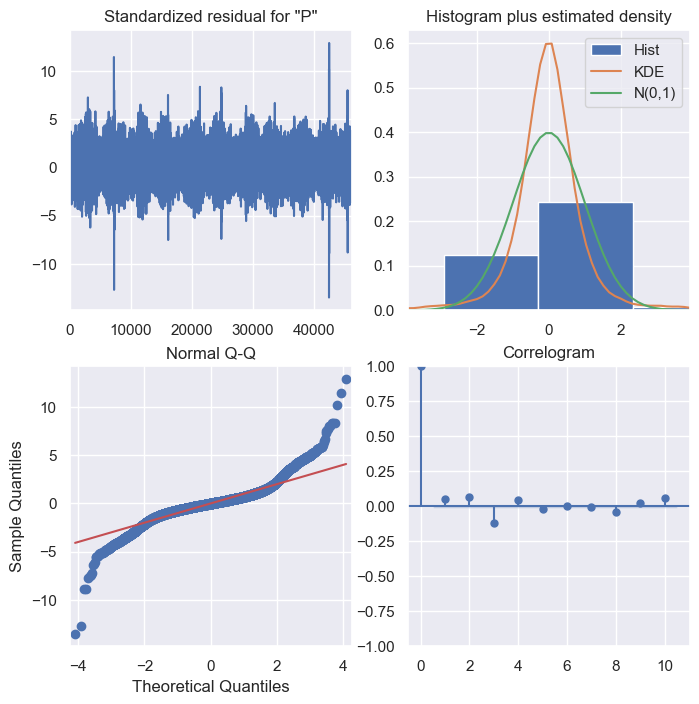

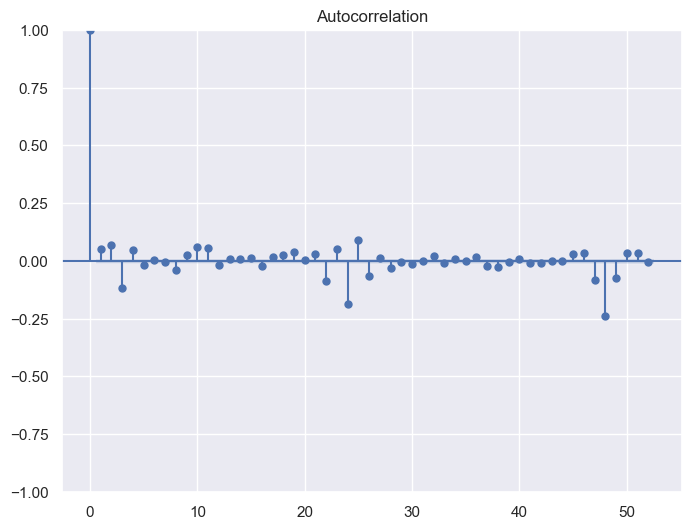

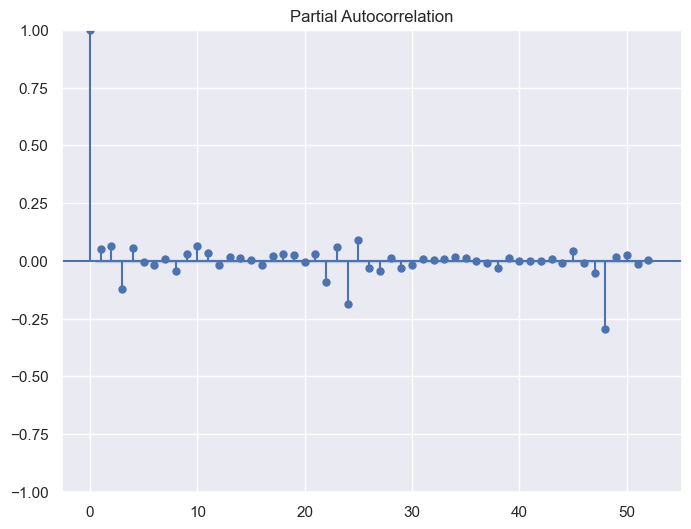

In [23]:
model = sarima(df_train['PJME_MW_transf'],2,0,1,0,1,0,24,52)

We see that the 24th and 48th bar is quite high. Lets try increasing the P value and see if the model improves:

                                      SARIMAX Results                                      
Dep. Variable:                      PJME_MW_transf   No. Observations:                46192
Model:             SARIMAX(2, 0, 1)x(1, 1, [], 24)   Log Likelihood              287198.767
Date:                             Thu, 10 Aug 2023   AIC                        -574387.534
Time:                                     21:03:52   BIC                        -574343.833
Sample:                                          0   HQIC                       -574373.794
                                           - 46192                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4440      0.002    583.477      0.000       1.439       1.449
ar.L2         -0.4788      

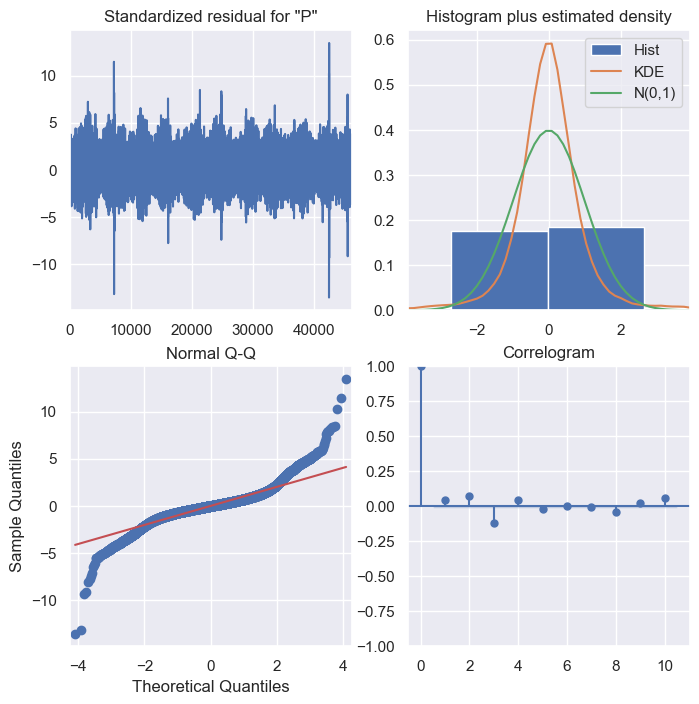

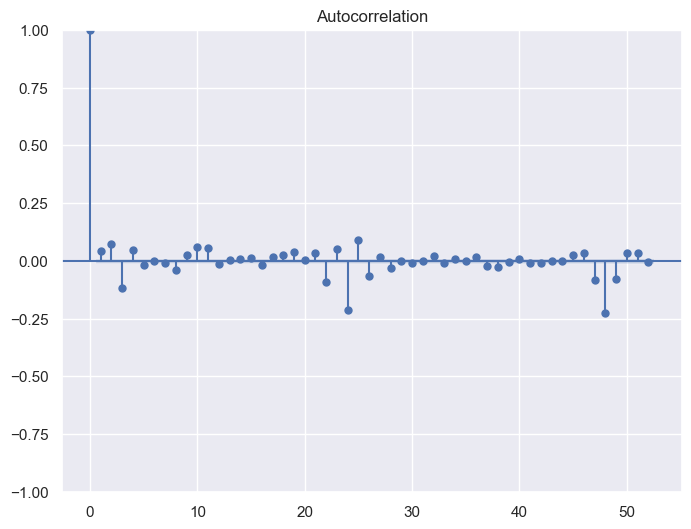

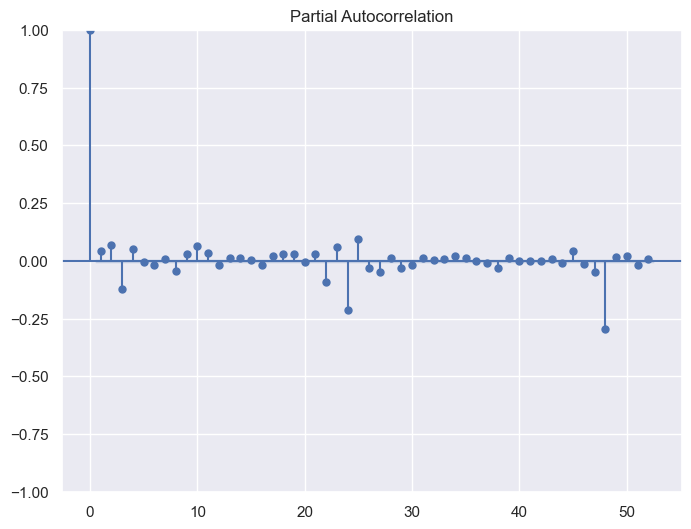

In [24]:
modelo = sarima(df_train['PJME_MW_transf'],2,0,1,1,1,0,24,52)

The model is really similar to the previous one, and on top of that, it has a lower Log Likelihood, so is not as accurate as the previous one. So, we will keep the previous model.

Now that we have a model fitted, we will predict the next 24 hours at once, and the we will compare with the actual values. We will only make it for the first week of the test set.

In [25]:
df_results = pd.DataFrame(model.get_forecast(steps = 24).predicted_mean)
#Appart from the prediction, I also want to see the previous days data
df_final = pd.concat([df_train[['Datetime','PJME_MW']][-24*4:],df_test[['Datetime','PJME_MW']].loc[df_results.index[0]:df_results.index[-1]]],axis=0)
df_final = df_final.join(df_results, how='left')
df_final

,Datetime,PJME_MW,predicted_mean
46096,2017-04-04 21:00:00,30503,NaN
46097,2017-04-04 22:00:00,29051,NaN
46098,2017-04-04 23:00:00,26613,NaN
46099,2017-04-05 00:00:00,24408,NaN
46100,2017-04-05 01:00:00,22777,NaN
...,...,...,...
46211,2017-04-09 16:00:00,23084,3.161304
46212,2017-04-09 17:00:00,23605,3.162045
46213,2017-04-09 18:00:00,24412,3.163057
46214,2017-04-09 19:00:00,25062,3.163945


In [26]:
from scipy.special import inv_boxcox
#we make the inverse of the boxcox transformation to get the actual predictions
df_final['prediccion_real'] = round(inv_boxcox(df_final['predicted_mean'],fitted_lambda))
#we also want to see the evolution of absolute error
df_final['Error Absoluto'] = abs(df_final['prediccion_real']-df_final['PJME_MW'])
df_final_dato = df_final[['Datetime','PJME_MW']]
df_final

,Datetime,PJME_MW,predicted_mean,prediccion_real,Error Absoluto
46096,2017-04-04 21:00:00,30503,NaN,NaN,NaN
46097,2017-04-04 22:00:00,29051,NaN,NaN,NaN
46098,2017-04-04 23:00:00,26613,NaN,NaN,NaN
46099,2017-04-05 00:00:00,24408,NaN,NaN,NaN
46100,2017-04-05 01:00:00,22777,NaN,NaN,NaN
...,...,...,...,...,...
46211,2017-04-09 16:00:00,23084,3.161304,23300.0,216.0
46212,2017-04-09 17:00:00,23605,3.162045,23659.0,54.0
46213,2017-04-09 18:00:00,24412,3.163057,24163.0,249.0
46214,2017-04-09 19:00:00,25062,3.163945,24615.0,447.0


Lets plot the predicion versus the actual values, and the absolute error of it.

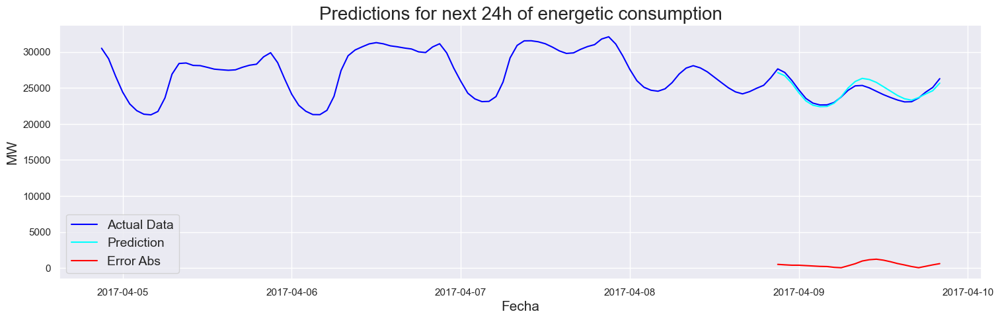

MSE:  362413.75
MAPE:  2.0242208117011424
R-Squared:  0.8047204324746068


In [32]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score

sns.set()

fig, ax=plt.subplots(figsize=(18,5))
sns.lineplot(x = 'Datetime', y = 'PJME_MW', data=df_final, color='Blue', label='Actual Data')
sns.lineplot(x = 'Datetime', y = 'prediccion_real', data=df_final.dropna(), color='cyan', label='Prediction')
sns.lineplot(x = 'Datetime', y = 'Error Absoluto', data=df_final.dropna(), color='red', label='Error Abs')
plt.legend(fontsize=14)
ax.set_xlabel('Fecha', fontsize=15)
ax.set_ylabel('MW', fontsize=15)
ax.set_title('Predictions for next 24h of energetic consumption', fontsize=20)
plt.show()

mse  = mean_squared_error(df_final['PJME_MW'][-24:],df_final['prediccion_real'].dropna())
mape  = mean_absolute_percentage_error(df_final['PJME_MW'][-24:],df_final['prediccion_real'].dropna())
r2 = r2_score(df_final['PJME_MW'][-24:],df_final['prediccion_real'].dropna())
print('MSE: ', mse)
print('MAPE: ', mape*100)
print('R-Squared: ', r2)

As we can see, we get a pretty reasonable prediciton metrics: MAPE of 2% seems like a reasonable good fit for the whole 24 hours.

We can also see that the period we have predicted has a distinct shape to the previous days, and still our model captures it well.

For the next 24h prediction we should add to the SARIMA model an extra day and run it, to re-fit the coefficients of the model.

We could probably improve the model by adding more seasonalities (using Fourier Transforms) and exogenous variables like vaccation days, or even spending more time adjusting the SARIMA hyperparameters.